In [1]:
import pandas as pd
import numpy as np
import time
import psutil
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, davies_bouldin_score, homogeneity_score
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from wordcloud import WordCloud
from adjustText import adjust_text
from sklearn.metrics import silhouette_score

In [2]:
df_tem = pd.read_csv("..\\..\\data\\words\\processed_words_set_from_the_supervisor.csv", encoding='windows-1251')
df_tem

,DocumentName,Word,NormalizedWord,FrequencyInText,FrequencyInCorpus,PartOfSpeech
0,VoenObozren2016_2019_1_0367.t,в,в,85,19397,F
1,VoenObozren2016_2019_1_0366.t,в,в,23,19397,F
2,VoenObozren2016_2019_1_0365.t,в,в,51,19397,F
3,VoenObozren2016_2019_1_0364.t,в,в,59,19397,F
4,VoenObozren2016_2019_1_0363.t,в,в,43,19397,F
...,...,...,...,...,...,...
207078,VoenObozren2016_2019_1_0001.t,калечащих,калечащий,1,1,A
207079,VoenObozren2016_2019_1_0001.t,заточка-пилка,заточка-пилка,1,1,N
207080,VoenObozren2016_2019_1_0001.t,зарослей,заросль,1,1,N
207081,VoenObozren2016_2019_1_0001.t,выручали,выручал,1,1,L


In [3]:
df = pd.read_csv("..\\..\\data\\words\\processed_words_set_from_the_supervisor.csv", encoding='windows-1251')
df[-30:]

,DocumentName,Word,NormalizedWord,FrequencyInText,FrequencyInCorpus,PartOfSpeech
207053,VoenObozren2016_2019_1_0003.t,Владикавказ,владикавказ,1,1,N
207054,VoenObozren2016_2019_1_0003.t,Азов,азов,1,1,N
207055,VoenObozren2016_2019_1_0002.t,сэкономив,сэкономив,1,1,Y
207056,VoenObozren2016_2019_1_0002.t,растительных,растительный,1,1,A
207057,VoenObozren2016_2019_1_0002.t,пропускаемого,пропускаемый,1,1,A
207058,VoenObozren2016_2019_1_0002.t,пробкового,пробковый,1,1,A
207059,VoenObozren2016_2019_1_0002.t,позволит,позволю,2,1,V
207060,VoenObozren2016_2019_1_0002.t,подозревал,подозревал,1,1,L
207061,VoenObozren2016_2019_1_0002.t,мыслящими,мыслящий,1,1,A
207062,VoenObozren2016_2019_1_0002.t,мыслительного,мыслительный,1,1,A


In [4]:
meaningless_pos = {'0', '&', 'F', 'e', 's', 'm', 'M', 'Y', 'n'}
df = df[~df['PartOfSpeech'].isin(meaningless_pos)]
df

,DocumentName,Word,NormalizedWord,FrequencyInText,FrequencyInCorpus,PartOfSpeech
1450,VoenObozren2016_2019_1_0367.t,было,был,13,5324,L
1451,VoenObozren2016_2019_1_0366.t,было,был,5,5324,L
1452,VoenObozren2016_2019_1_0365.t,было,был,30,5324,L
1453,VoenObozren2016_2019_1_0364.t,было,был,4,5324,L
1454,VoenObozren2016_2019_1_0363.t,было,был,19,5324,L
...,...,...,...,...,...,...
207078,VoenObozren2016_2019_1_0001.t,калечащих,калечащий,1,1,A
207079,VoenObozren2016_2019_1_0001.t,заточка-пилка,заточка-пилка,1,1,N
207080,VoenObozren2016_2019_1_0001.t,зарослей,заросль,1,1,N
207081,VoenObozren2016_2019_1_0001.t,выручали,выручал,1,1,L


In [5]:
meaningless_words = {
    'быть', 'был', 'есть', 'будет', 'может', 'мочь', 'являться',
    'имеющий', 'имеющая', 'имеющее', 'имеющие',
    'идущий', 'идущая', 'идущие', 'идущего',
    'он', 'я', 'сам', 'сама', 'само', 'сами', 'тот', 'та', 'то', 'те', 
    'мог', 'могли', 'могла', 'смог', 'смогла', 'их', 'ее', 'её',
    'такой', 'такая', 'такое', 'такие', 'данный', 'данная', 
    'данное', 'данные', 'стал', 'стала', 'имел',
    'чего', 'почему', 'зачем', 'где', 'когда', 'пока',
    'уже', 'еще', 'сейчас', 'теперь', 'тогда',
    'должен', 'должна', 'должно', 'должны',
    'человек', 'люди', 'раз', 'мир', 'время', 'год',
    'прошлый', 'следующий', 'новый', 'старый', 'большой', 'маленький',
    'который', 'которая', 'которое', 'которые',
    'поэтому',
    'дело', 'вещь', 'что-то', 'что-либо', 'кое-что', 'штука',
    'ситуация', 'случай', 'момент', 'аспект', 'объект', 'область',
    'вопрос', 'ответ', 'результат', 'процесс', 'причина', 'форма',
    'тип', 'уровень', 'вид', 'сфера', 'фактор', 'значение',
    'позиция', 'точка', 'точка зрения', 'цель', 'направление',
    'состояние', 'характер', 'пример', 'метод', 'способ', 'мера',
    'средство', 'роль', 'функция', 'элемент', 'пункт',
    'параметр', 'показатель', 'информация', 'факт',
    'явление', 'обстоятельство', 'основание', 'принцип',
    'контекст', 'подход', 'модель', 'структура', 'категория'
    'м', 'км', 'см', 'мм', 'нм', 'мкм', 'кг', 'г', 'мг', 'т', 'л', 'мл', 'н',
    'м³', 'см³', 'мм³', 'Н', 'Па', 'кПа', 'МПа', 'В', 'мВ', 'кВ', 'А', 'мА', 
    'кА', 'Ом', 'кОм', 'МОм', 'Дж', 'кДж', 'МДж', 'Вт', 'кВт', 'МВт', 'ГВт', 
    'Гц', 'кГц', 'МГц', 'ГГц', 'лк', 'К', '°C', '°F', 'с', 'мин', 'ч', 'сут', 
    'нед', 'мес', 'г', 'об/мин', 'лс', 'бар', 'м/с', 'км/ч', 'рад', 'град', 
    'лм', 'Тл', 'Гн', 'Ф', 'Б', 'кБ', 'МБ', 'ГБ', 'ТБ', 'ПБ', 'дБ', '%', 
    'ppm', 'моль', 'экз', 'кал', 'ккал', 'эрг', 'h', 'мк', 'вк'
}
df = df[~df['NormalizedWord'].isin(meaningless_words)]
df

,DocumentName,Word,NormalizedWord,FrequencyInText,FrequencyInCorpus,PartOfSpeech
5956,VoenObozren2016_2019_1_0364.t,ракеты,ракета,37,2217,N
5957,VoenObozren2016_2019_1_0362.t,ракет,ракета,2,2217,N
5958,VoenObozren2016_2019_1_0359.t,ракет,ракета,1,2217,N
5959,VoenObozren2016_2019_1_0353.t,ракет,ракета,3,2217,N
5960,VoenObozren2016_2019_1_0352.t,ракеты,ракета,1,2217,N
...,...,...,...,...,...,...
207078,VoenObozren2016_2019_1_0001.t,калечащих,калечащий,1,1,A
207079,VoenObozren2016_2019_1_0001.t,заточка-пилка,заточка-пилка,1,1,N
207080,VoenObozren2016_2019_1_0001.t,зарослей,заросль,1,1,N
207081,VoenObozren2016_2019_1_0001.t,выручали,выручал,1,1,L


In [6]:
df = df.copy()
df['FrequencyInText'] = df['FrequencyInText'].astype(int)
df['FrequencyInCorpus'] = df['FrequencyInCorpus'].astype(int)

filtered_df = df[(df['FrequencyInCorpus'] > 1) & (df['FrequencyInText'] > 1)]
doc_word_matrix = filtered_df.pivot_table(
    index='DocumentName',
    columns='NormalizedWord',
    values='FrequencyInText',
    aggfunc='sum',
    fill_value=0
)

filtered_df

,DocumentName,Word,NormalizedWord,FrequencyInText,FrequencyInCorpus,PartOfSpeech
5956,VoenObozren2016_2019_1_0364.t,ракеты,ракета,37,2217,N
5957,VoenObozren2016_2019_1_0362.t,ракет,ракета,2,2217,N
5959,VoenObozren2016_2019_1_0353.t,ракет,ракета,3,2217,N
5962,VoenObozren2016_2019_1_0346.t,ракетами,ракета,2,2217,N
5963,VoenObozren2016_2019_1_0345.t,ракеты,ракета,17,2217,N
...,...,...,...,...,...,...
198152,VoenObozren2016_2019_1_0004.t,плащ-палатка,плащ-палатка,2,2,N
198164,VoenObozren2016_2019_1_0003.t,юнга,юнга,2,2,N
198182,VoenObozren2016_2019_1_0002.t,изготовлять,изготовлять,2,2,I
198187,VoenObozren2016_2019_1_0002.t,Голограммы,голограмма,2,2,N


In [7]:
doc_word_matrix

NormalizedWord,Бронеавтомобиль-бронедрезина,Бугско-Днепровско-лиманского,Бугско-Днепровско-лиманскому,абакан,абдалла,абердинский,абонент,абонентский,абрамович,абрамс,...,ярыгин,ясень,ясень-м,ясный,ястреб,яуза,яхонт,ячейка,ящик,яэу
DocumentName,,,,,,,,,,,,,,,,,,,,,
VoenObozren2016_2019_1_0001.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
VoenObozren2016_2019_1_0002.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
VoenObozren2016_2019_1_0003.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
VoenObozren2016_2019_1_0004.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
VoenObozren2016_2019_1_0005.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VoenObozren2016_2019_1_0363.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
VoenObozren2016_2019_1_0364.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
VoenObozren2016_2019_1_0365.t,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
doc_word_matrix[doc_word_matrix["абонент"] > 0]

NormalizedWord,Бронеавтомобиль-бронедрезина,Бугско-Днепровско-лиманского,Бугско-Днепровско-лиманскому,абакан,абдалла,абердинский,абонент,абонентский,абрамович,абрамс,...,ярыгин,ясень,ясень-м,ясный,ястреб,яуза,яхонт,ячейка,ящик,яэу
DocumentName,,,,,,,,,,,,,,,,,,,,,
VoenObozren2016_2019_1_0200.t,0,0,0,0,0,0,2,3,0,0,...,0,0,0,0,0,0,0,0,0,0
VoenObozren2016_2019_1_0286.t,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
filtered_data = doc_word_matrix.loc[doc_word_matrix.index == "VoenObozren2016_2019_1_0024.t"]
filtered_data = filtered_data.loc[:, filtered_data.gt(0).any(axis=0)]

filtered_data

NormalizedWord,активен,артиллерийский,атк,база,боевой,боеприпас,бой,бороться,борьба,бронебойный,...,укрепление,упрощение,характеристика,ход,целый,часть,чел,четверка,шоссе,ящик
DocumentName,,,,,,,,,,,,,,,,,,,,,
VoenObozren2016_2019_1_0024.t,2,6,2,2,9,3,2,2,2,2,...,2,2,3,4,2,2,2,2,2,3


In [10]:
process = psutil.Process()

mem_before = process.memory_info().rss
start_time = time.perf_counter()

transformer = TfidfTransformer()
tfidf_matrix = transformer.fit_transform(doc_word_matrix)

elapsed = time.perf_counter() - start_time
mem_after = process.memory_info().rss

print(f"[PROFILE][TF-IDF] Время: {elapsed:.4f} сек | Память: {(mem_after - mem_before) / (1024**2):.2f} MB")

mem_before = process.memory_info().rss
start_time = time.perf_counter()

similarity_matrix = cosine_similarity(tfidf_matrix)

elapsed = time.perf_counter() - start_time
mem_after = process.memory_info().rss

print(f"[PROFILE][Cosine Similarity] Время: {elapsed:.4f} сек | Память: {(mem_after - mem_before) / (1024**2):.2f} MB")

similarity_df = pd.DataFrame(similarity_matrix, index=doc_word_matrix.index, columns=doc_word_matrix.index)
similarity_df.to_csv("..\\..\\data\\words\\cosine_similarity_matrix.csv", index=True)
similarity_df

[PROFILE][TF-IDF] Время: 0.0543 сек | Память: 0.09 MB
[PROFILE][Cosine Similarity] Время: 0.0050 сек | Память: 2.13 MB


DocumentName,VoenObozren2016_2019_1_0001.t,VoenObozren2016_2019_1_0002.t,VoenObozren2016_2019_1_0003.t,VoenObozren2016_2019_1_0004.t,VoenObozren2016_2019_1_0005.t,VoenObozren2016_2019_1_0006.t,VoenObozren2016_2019_1_0007.t,VoenObozren2016_2019_1_0008.t,VoenObozren2016_2019_1_0009.t,VoenObozren2016_2019_1_0010.t,...,VoenObozren2016_2019_1_0358.t,VoenObozren2016_2019_1_0359.t,VoenObozren2016_2019_1_0360.t,VoenObozren2016_2019_1_0361.t,VoenObozren2016_2019_1_0362.t,VoenObozren2016_2019_1_0363.t,VoenObozren2016_2019_1_0364.t,VoenObozren2016_2019_1_0365.t,VoenObozren2016_2019_1_0366.t,VoenObozren2016_2019_1_0367.t
DocumentName,,,,,,,,,,,,,,,,,,,,,
VoenObozren2016_2019_1_0001.t,1.000000,0.000000,0.029172,0.027879,0.019105,0.018419,0.029886,0.005038,0.020833,0.010280,...,0.010796,0.011948,0.038754,0.012311,0.010688,0.004038,0.008422,0.003743,0.000000,0.016551
VoenObozren2016_2019_1_0002.t,0.000000,1.000000,0.000000,0.004688,0.006446,0.009877,0.007452,0.008841,0.005982,0.000000,...,0.027062,0.013776,0.003155,0.004370,0.033247,0.004545,0.019792,0.005392,0.014545,0.005636
VoenObozren2016_2019_1_0003.t,0.029172,0.000000,1.000000,0.007261,0.112206,0.023095,0.013412,0.008108,0.215858,0.006502,...,0.143165,0.231932,0.119727,0.056775,0.031224,0.177789,0.048749,0.001054,0.001272,0.002081
VoenObozren2016_2019_1_0004.t,0.027879,0.004688,0.007261,1.000000,0.088383,0.186718,0.027855,0.013304,0.012351,0.010832,...,0.009083,0.003715,0.031450,0.035154,0.017294,0.008393,0.005670,0.007187,0.009827,0.018026
VoenObozren2016_2019_1_0005.t,0.019105,0.006446,0.112206,0.088383,1.000000,0.096554,0.028953,0.011705,0.078476,0.012782,...,0.057965,0.078274,0.066502,0.043119,0.043388,0.015350,0.024584,0.003704,0.004527,0.010751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VoenObozren2016_2019_1_0363.t,0.004038,0.004545,0.177789,0.008393,0.015350,0.010705,0.015443,0.010646,0.029165,0.006222,...,0.022798,0.058273,0.092293,0.044254,0.014626,1.000000,0.054435,0.008289,0.006766,0.009365
VoenObozren2016_2019_1_0364.t,0.008422,0.019792,0.048749,0.005670,0.024584,0.009173,0.015734,0.015391,0.037313,0.015439,...,0.045845,0.034517,0.028177,0.011015,0.057251,0.054435,1.000000,0.004513,0.008596,0.006272
VoenObozren2016_2019_1_0365.t,0.003743,0.005392,0.001054,0.007187,0.003704,0.006176,0.002895,0.003425,0.002624,0.000752,...,0.002679,0.009346,0.005409,0.007222,0.012865,0.008289,0.004513,1.000000,0.537626,0.884327


In [11]:
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), index=doc_word_matrix.index, columns=doc_word_matrix.columns)
tfidf_matrix_tem = tfidf_df.loc[tfidf_df.index == "VoenObozren2016_2019_1_0024.t"]

tfidf_matrix_tem = tfidf_matrix_tem.loc[:, tfidf_matrix_tem.gt(0).any(axis=0)]

tfidf_matrix_tem

NormalizedWord,активен,артиллерийский,атк,база,боевой,боеприпас,бой,бороться,борьба,бронебойный,...,укрепление,упрощение,характеристика,ход,целый,часть,чел,четверка,шоссе,ящик
DocumentName,,,,,,,,,,,,,,,,,,,,,
VoenObozren2016_2019_1_0024.t,0.039444,0.07851,0.050835,0.021214,0.055882,0.037303,0.021416,0.042236,0.026347,0.034653,...,0.043407,0.046356,0.028768,0.035858,0.027492,0.012984,0.054389,0.054389,0.039444,0.06511


In [12]:
def save_clusters(labels, method_name):
    cluster_df = pd.DataFrame({"Document": doc_word_matrix.index, "Cluster": labels})
    cluster_df.to_csv(f"..\\..\\data\\words\\{method_name}_clusters.csv", index=False)

def save_cluster_centers(tfidf_matrix, labels, method_name):
    unique_clusters = np.unique(labels)
    cluster_centers = []

    for cluster in unique_clusters:
        if cluster == -1:
            continue
        cluster_indices = np.where(labels == cluster)[0]
        cluster_vectors = tfidf_matrix[cluster_indices].toarray()
        center_idx = np.argmin(cdist([cluster_vectors.mean(axis=0)], cluster_vectors)[0])
        central_file = doc_word_matrix.index[cluster_indices[center_idx]]
        cluster_centers.append((cluster, central_file))

    centers_df = pd.DataFrame(cluster_centers, columns=["Cluster", "Central_File"])
    centers_df.to_csv(f"..\\..\\data\\words\\{method_name}_cluster_centers.csv", index=False)

In [13]:
k = 30
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans_labels = kmeans.fit_predict(tfidf_matrix)
save_clusters(kmeans_labels, "kmeans")
save_cluster_centers(tfidf_matrix, kmeans_labels, "kmeans")

In [14]:
eps = 0.6
min_samples = 5
dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric="cosine")
dbscan_labels = dbscan.fit_predict(tfidf_matrix)
save_clusters(dbscan_labels, "dbscan")
save_cluster_centers(tfidf_matrix, dbscan_labels, "dbscan")

In [15]:
n_clusters_agglo = 35
agglo = AgglomerativeClustering(n_clusters=n_clusters_agglo, metric="cosine", linkage="average")
agglo_labels = agglo.fit_predict(tfidf_matrix.toarray())
save_clusters(agglo_labels, "agglomerative")
save_cluster_centers(tfidf_matrix, agglo_labels, "agglomerative")

In [16]:
def load_clusters(file_name):
    return pd.read_csv(file_name)

In [17]:
kmeans_clusters = load_clusters("..\\..\\data\\words\\kmeans_clusters.csv")
dbscan_clusters = load_clusters("..\\..\\data\\words\\dbscan_clusters.csv")
agglo_clusters = load_clusters("..\\..\\data\\words\\agglomerative_clusters.csv")

kmeans_cluster_centers = load_clusters("..\\..\\data\\words\\kmeans_cluster_centers.csv")
dbscan_cluster_centers = load_clusters("..\\..\\data\\words\\dbscan_cluster_centers.csv")
agglo_cluster_centers = load_clusters("..\\..\\data\\words\\agglomerative_cluster_centers.csv")

In [18]:
def visualize_clusters(labels, tfidf_matrix, method_name):
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000, metric='cosine')
    tsne_res = tsne.fit_transform(tfidf_matrix.toarray())

    unique_labels = np.unique(labels)
    cmap = ListedColormap(plt.cm.get_cmap('tab20', len(unique_labels)).colors)

    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(tsne_res[:, 0], tsne_res[:, 1], c=labels, cmap=cmap, s=10, alpha=0.9)
    plt.colorbar(scatter, label=f'{method_name} Cluster', ticks=range(len(unique_labels)))
    plt.title(f't-SNE визуализация кластеров {method_name}')
    plt.xlabel('t-SNE измерение 1')
    plt.ylabel('t-SNE измерение 2')
    plt.grid(True)
    plt.show()

    unique_clusters, counts = np.unique(labels, return_counts=True)
    print(f"{method_name} кластеры:", dict(zip(unique_clusters, counts)))

def generate_word_cloud(cluster_label, cluster_df, method_name):
    cluster_files = cluster_df[cluster_df['Cluster'] == cluster_label]['Document']
    print(f"Файлы в кластере {cluster_label} ({method_name}):")
    for f in cluster_files:
        print(f)

    for doc_name in cluster_files:
        doc_data = filtered_df[filtered_df['DocumentName'] == doc_name]
        word_freq = dict(zip(doc_data['NormalizedWord'], doc_data['FrequencyInText']))
        wc = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
        plt.figure(figsize=(10, 5))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Облако слов для {doc_name}')
        plt.show()

def evaluate_clustering_quality(tfidf_matrix, labels, method_name):
    unique_labels = np.unique(labels)
    
    if len(unique_labels) > 1:
        silhouette = silhouette_score(tfidf_matrix, labels, metric='cosine')
        davies_bouldin = davies_bouldin_score(tfidf_matrix.toarray(), labels)
        homogeneity = homogeneity_score(true_labels, labels) if 'true_labels' in globals() else None
    else:
        silhouette, davies_bouldin, homogeneity = None, None, None
    
    print(f"Метрики качества для {method_name}:")
    print(f"  - Силуэтный коэффициент: {silhouette}")
    print(f"  - Коэффициент Давиеса-Боулдина: {davies_bouldin}")
    if homogeneity is not None:
        print(f"  - Гомогенность: {homogeneity}")

In [19]:
process = psutil.Process()

mem_before = process.memory_info().rss
start_time = time.perf_counter()

transformer = TfidfTransformer()
tfidf_matrix = transformer.fit_transform(doc_word_matrix)

elapsed = time.perf_counter() - start_time
mem_after = process.memory_info().rss

print(f"[PROFILE][TF-IDF] Время: {elapsed:.4f} сек | Память: {(mem_after - mem_before) / (1024**2):.2f} MB")

[PROFILE][TF-IDF] Время: 0.0519 сек | Память: 0.02 MB


C:\Users\Juliana\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\Juliana\AppData\Local\Temp\ipykernel_9828\3451227796.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = ListedColormap(plt.cm.get_cmap('tab20', len(unique_labels)).colors)


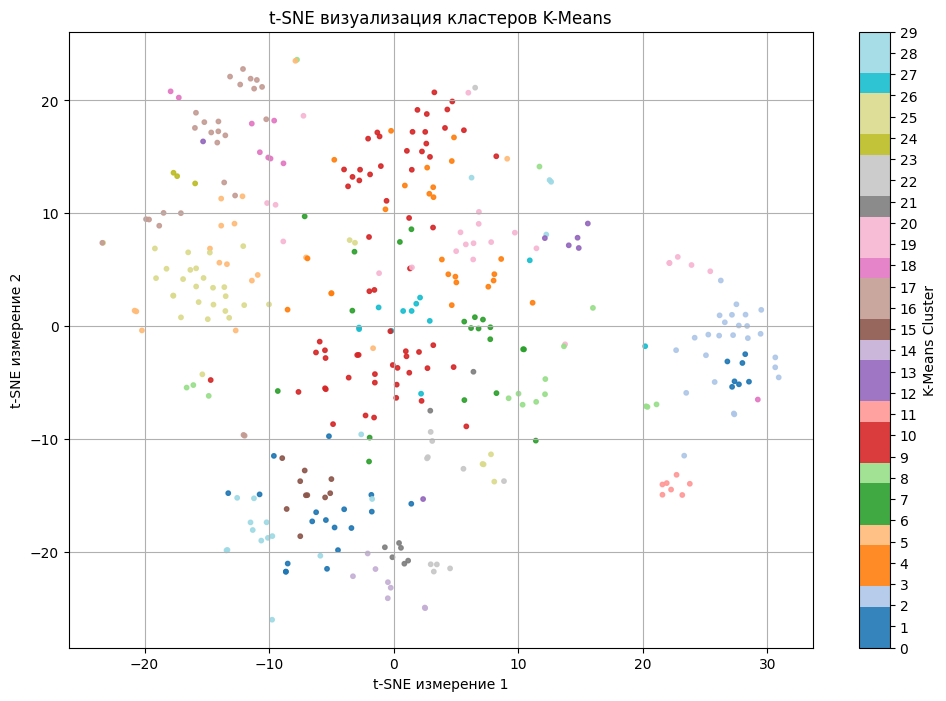

K-Means кластеры: {0: 7, 1: 18, 2: 25, 3: 10, 4: 14, 5: 17, 6: 10, 7: 10, 8: 16, 9: 18, 10: 44, 11: 7, 12: 1, 13: 6, 14: 8, 15: 10, 16: 7, 17: 19, 18: 9, 19: 7, 20: 16, 21: 8, 22: 7, 23: 4, 24: 3, 25: 26, 26: 6, 27: 12, 28: 12, 29: 6}
Файлы в кластере 9 (K-Means):
VoenObozren2016_2019_1_0005.t
VoenObozren2016_2019_1_0082.t
VoenObozren2016_2019_1_0095.t
VoenObozren2016_2019_1_0097.t
VoenObozren2016_2019_1_0098.t
VoenObozren2016_2019_1_0099.t
VoenObozren2016_2019_1_0101.t
VoenObozren2016_2019_1_0106.t
VoenObozren2016_2019_1_0148.t
VoenObozren2016_2019_1_0156.t
VoenObozren2016_2019_1_0212.t
VoenObozren2016_2019_1_0213.t
VoenObozren2016_2019_1_0214.t
VoenObozren2016_2019_1_0215.t
VoenObozren2016_2019_1_0228.t
VoenObozren2016_2019_1_0251.t
VoenObozren2016_2019_1_0253.t
VoenObozren2016_2019_1_0323.t


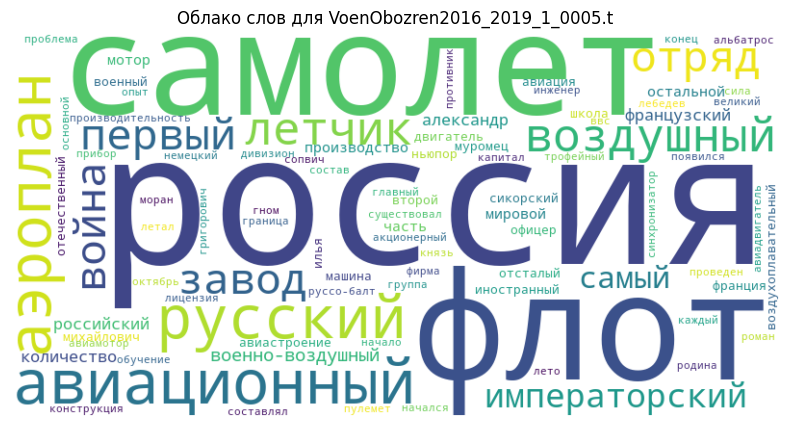

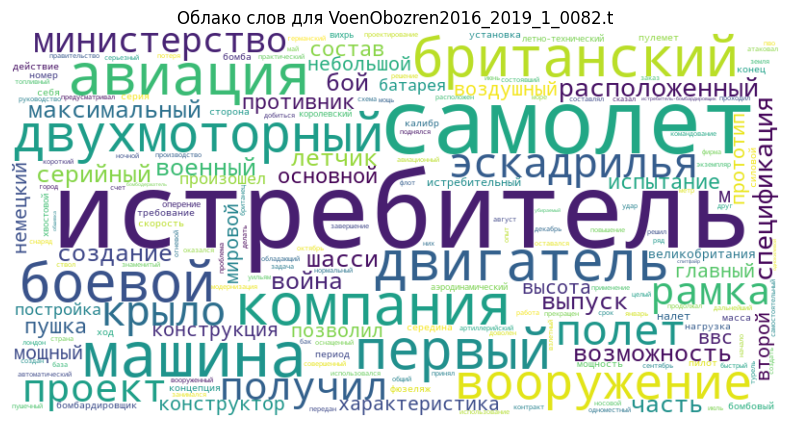

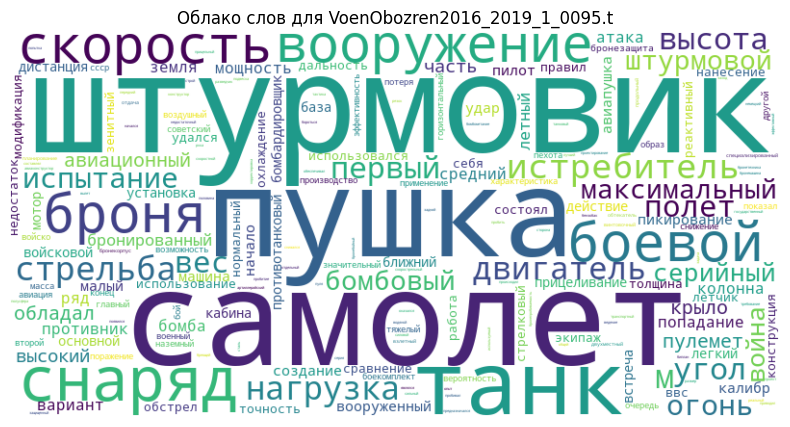

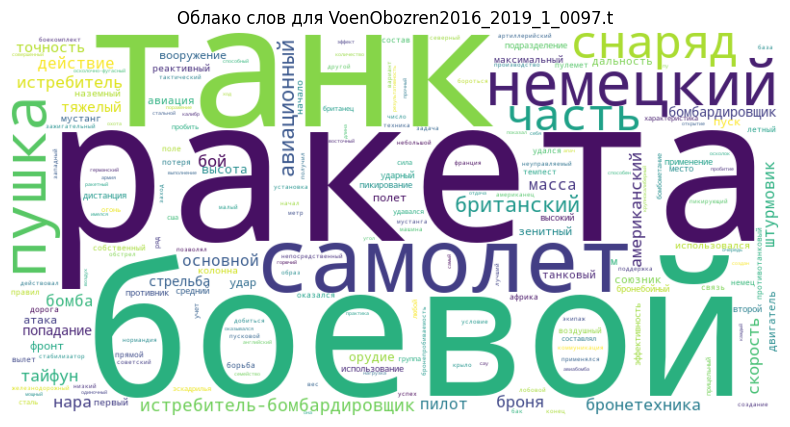

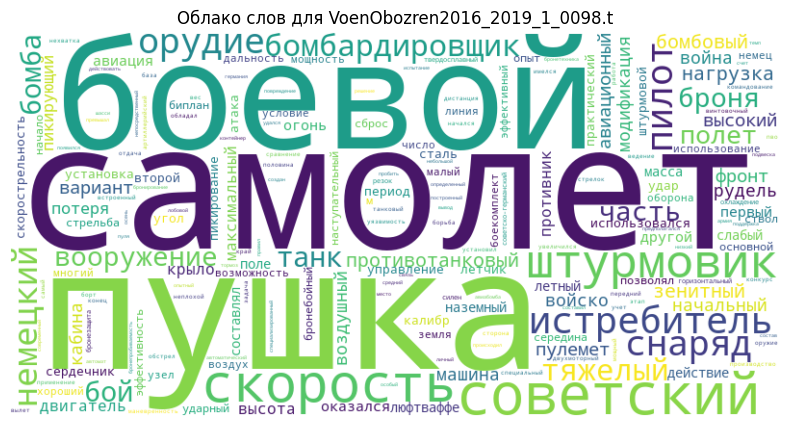

...

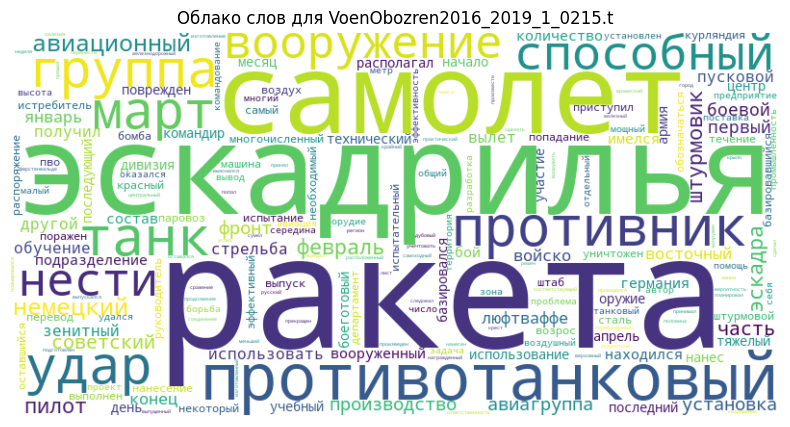

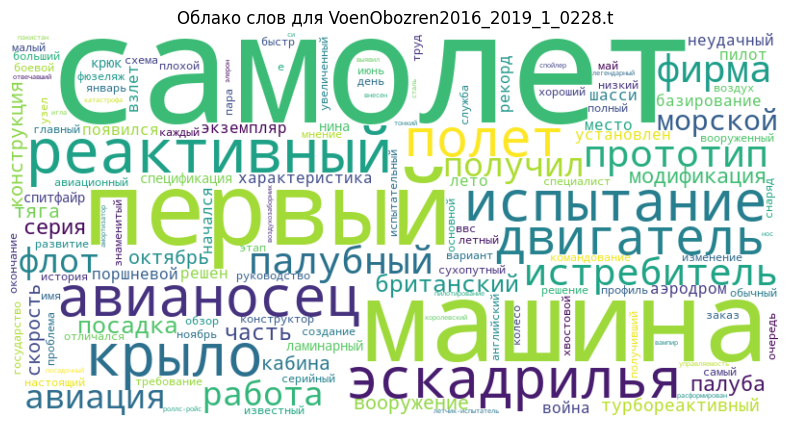

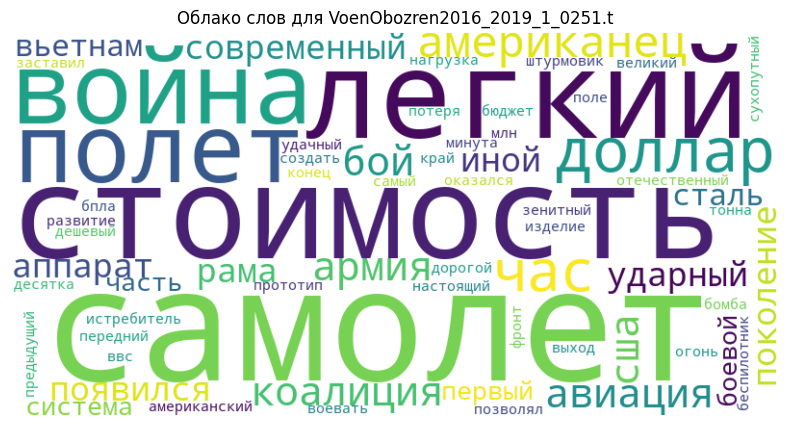

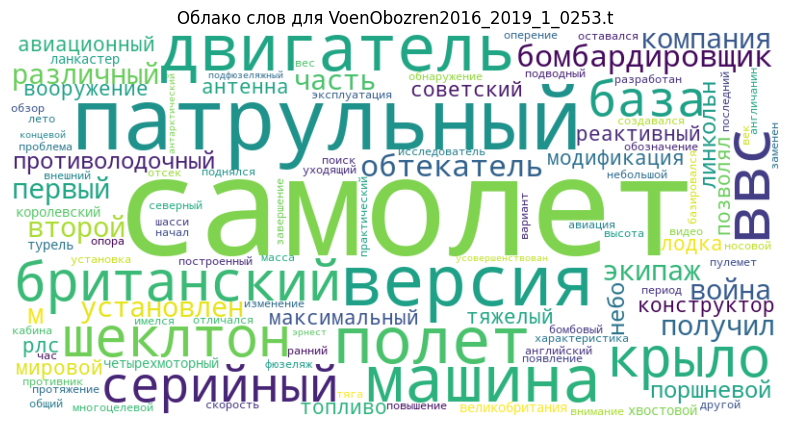

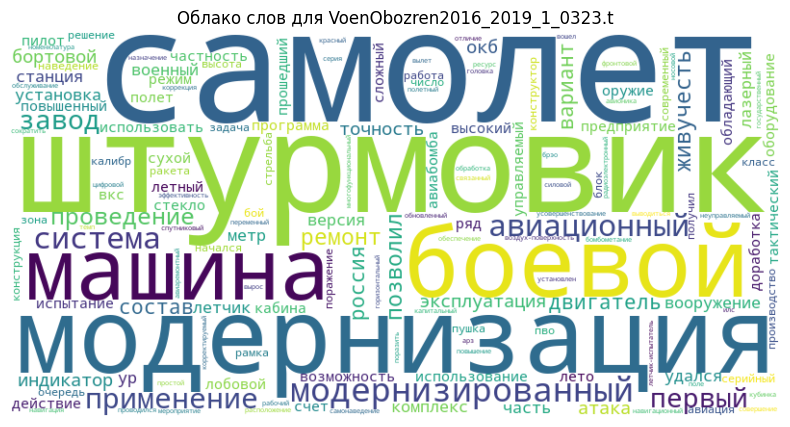

,Document,Cluster
0,VoenObozren2016_2019_1_0001.t,8
1,VoenObozren2016_2019_1_0002.t,22
2,VoenObozren2016_2019_1_0003.t,1
3,VoenObozren2016_2019_1_0004.t,2
4,VoenObozren2016_2019_1_0005.t,9
...,...,...
358,VoenObozren2016_2019_1_0363.t,14
359,VoenObozren2016_2019_1_0364.t,10
360,VoenObozren2016_2019_1_0365.t,11
361,VoenObozren2016_2019_1_0366.t,11


In [20]:
visualize_clusters(kmeans_clusters['Cluster'].values, tfidf_matrix, "K-Means")
generate_word_cloud(9, kmeans_clusters, "K-Means")
kmeans_clusters

In [21]:
kmeans_cluster_centers

,Cluster,Central_File
0,0,VoenObozren2016_2019_1_0337.t
1,1,VoenObozren2016_2019_1_0118.t
2,2,VoenObozren2016_2019_1_0222.t
3,3,VoenObozren2016_2019_1_0077.t
4,4,VoenObozren2016_2019_1_0279.t
5,5,VoenObozren2016_2019_1_0292.t
6,6,VoenObozren2016_2019_1_0105.t
7,7,VoenObozren2016_2019_1_0059.t
8,8,VoenObozren2016_2019_1_0033.t
9,9,VoenObozren2016_2019_1_0095.t


In [22]:
evaluate_clustering_quality(tfidf_matrix, kmeans_labels, "K-Means")

Метрики качества для K-Means:
  - Силуэтный коэффициент: 0.05519009570736954
  - Коэффициент Давиеса-Боулдина: 3.2998429330440286


C:\Users\Juliana\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\Juliana\AppData\Local\Temp\ipykernel_9828\3451227796.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = ListedColormap(plt.cm.get_cmap('tab20', len(unique_labels)).colors)


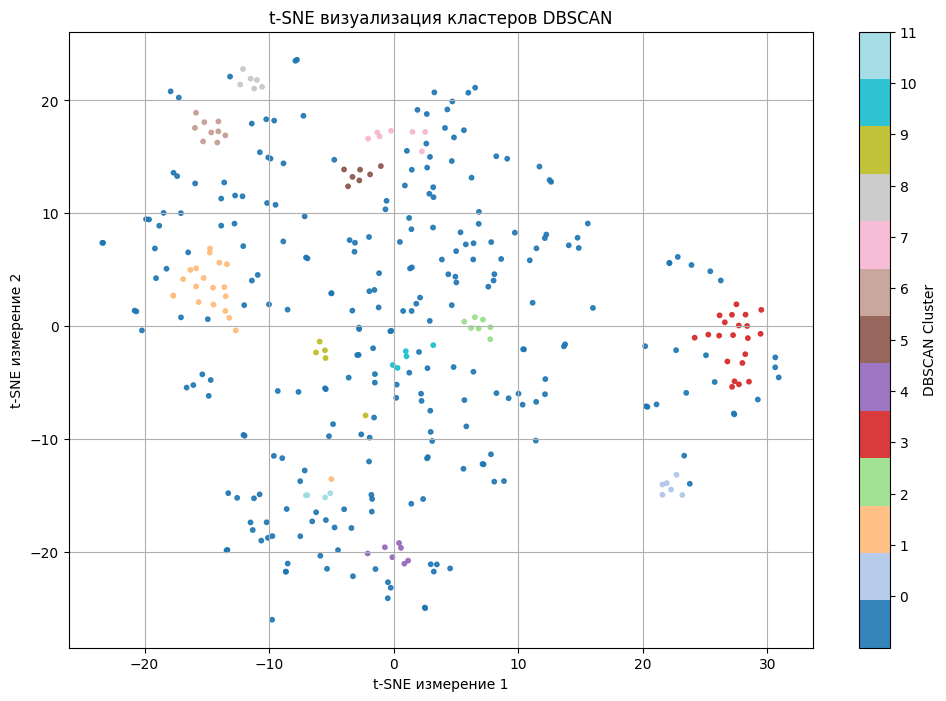

DBSCAN кластеры: {-1: 259, 0: 6, 1: 20, 2: 7, 3: 21, 4: 7, 5: 7, 6: 9, 7: 7, 8: 6, 9: 5, 10: 5, 11: 4}
Файлы в кластере 5 (DBSCAN):
VoenObozren2016_2019_1_0095.t
VoenObozren2016_2019_1_0097.t
VoenObozren2016_2019_1_0098.t
VoenObozren2016_2019_1_0099.t
VoenObozren2016_2019_1_0101.t
VoenObozren2016_2019_1_0106.t
VoenObozren2016_2019_1_0323.t


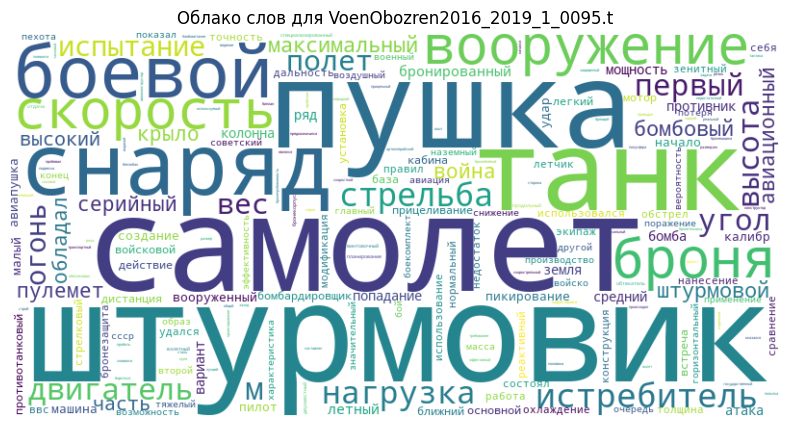

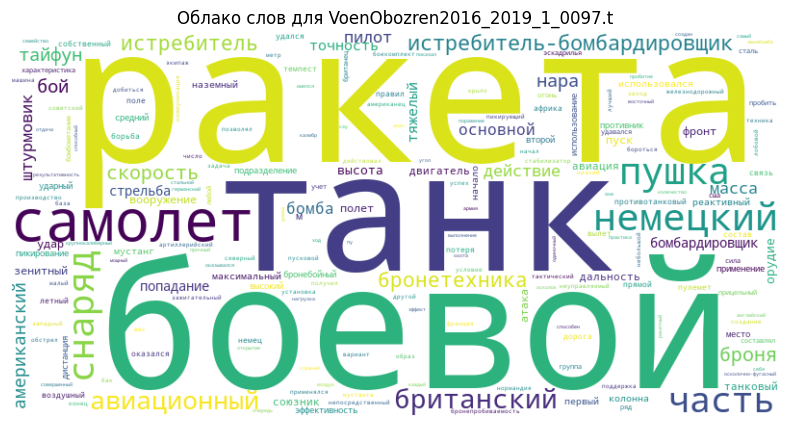

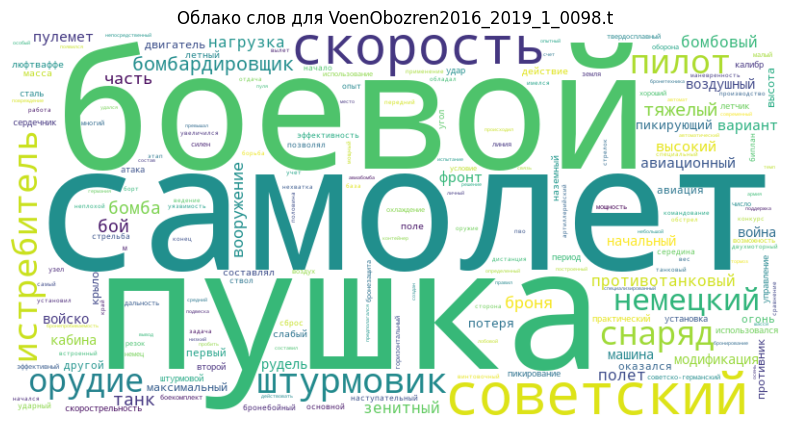

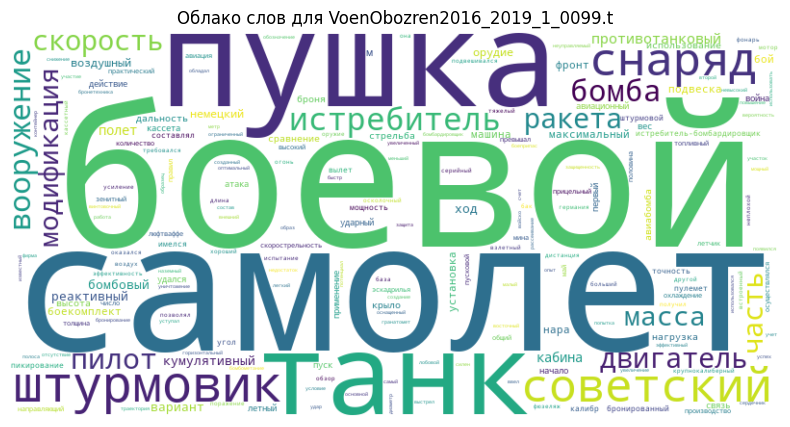

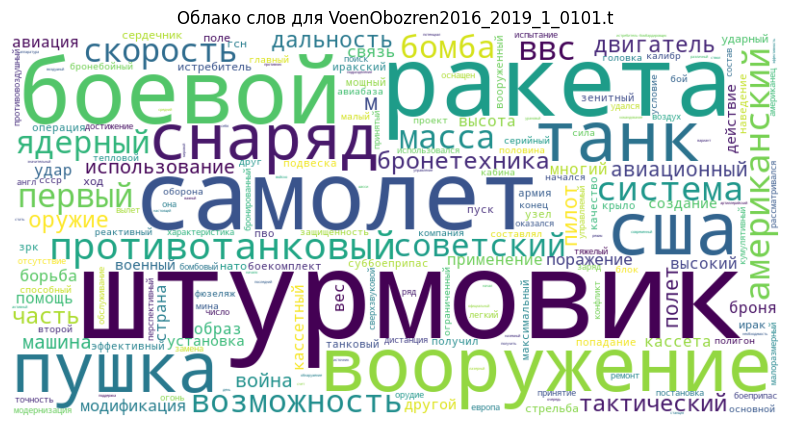

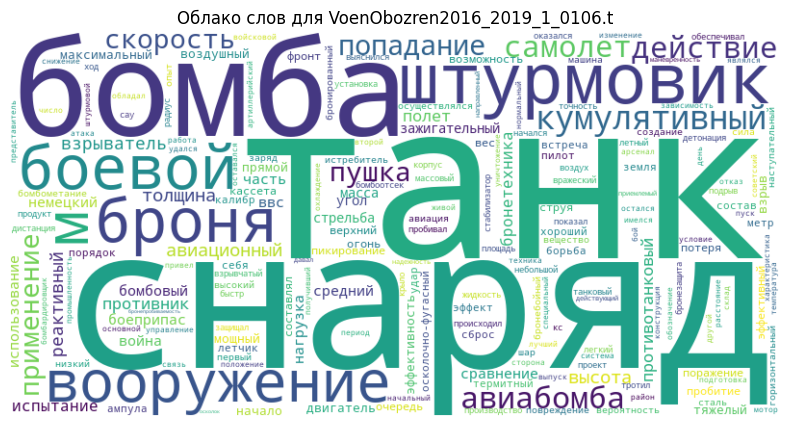

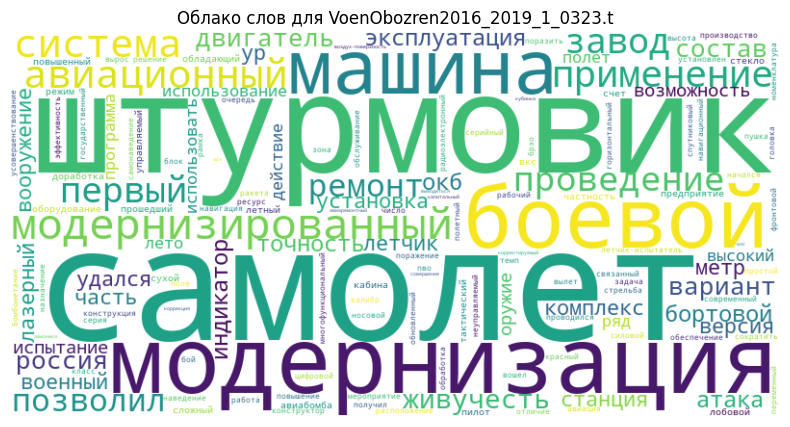

,Document,Cluster
0,VoenObozren2016_2019_1_0001.t,-1
1,VoenObozren2016_2019_1_0002.t,-1
2,VoenObozren2016_2019_1_0003.t,-1
3,VoenObozren2016_2019_1_0004.t,-1
4,VoenObozren2016_2019_1_0005.t,-1
...,...,...
358,VoenObozren2016_2019_1_0363.t,-1
359,VoenObozren2016_2019_1_0364.t,-1
360,VoenObozren2016_2019_1_0365.t,0
361,VoenObozren2016_2019_1_0366.t,0


In [23]:
visualize_clusters(dbscan_clusters['Cluster'].values, tfidf_matrix, "DBSCAN")
generate_word_cloud(5, dbscan_clusters, "DBSCAN")
dbscan_clusters

In [24]:
dbscan_cluster_centers

,Cluster,Central_File
0,0,VoenObozren2016_2019_1_0367.t
1,1,VoenObozren2016_2019_1_0062.t
2,2,VoenObozren2016_2019_1_0105.t
3,3,VoenObozren2016_2019_1_0141.t
4,4,VoenObozren2016_2019_1_0073.t
5,5,VoenObozren2016_2019_1_0095.t
6,6,VoenObozren2016_2019_1_0129.t
7,7,VoenObozren2016_2019_1_0213.t
8,8,VoenObozren2016_2019_1_0248.t
9,9,VoenObozren2016_2019_1_0267.t


In [25]:
evaluate_clustering_quality(tfidf_matrix, dbscan_labels, "DBSCAN")

Метрики качества для DBSCAN:
  - Силуэтный коэффициент: 0.008941907688570292
  - Коэффициент Давиеса-Боулдина: 2.506687516079069


C:\Users\Juliana\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
C:\Users\Juliana\AppData\Local\Temp\ipykernel_9828\3451227796.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = ListedColormap(plt.cm.get_cmap('tab20', len(unique_labels)).colors)


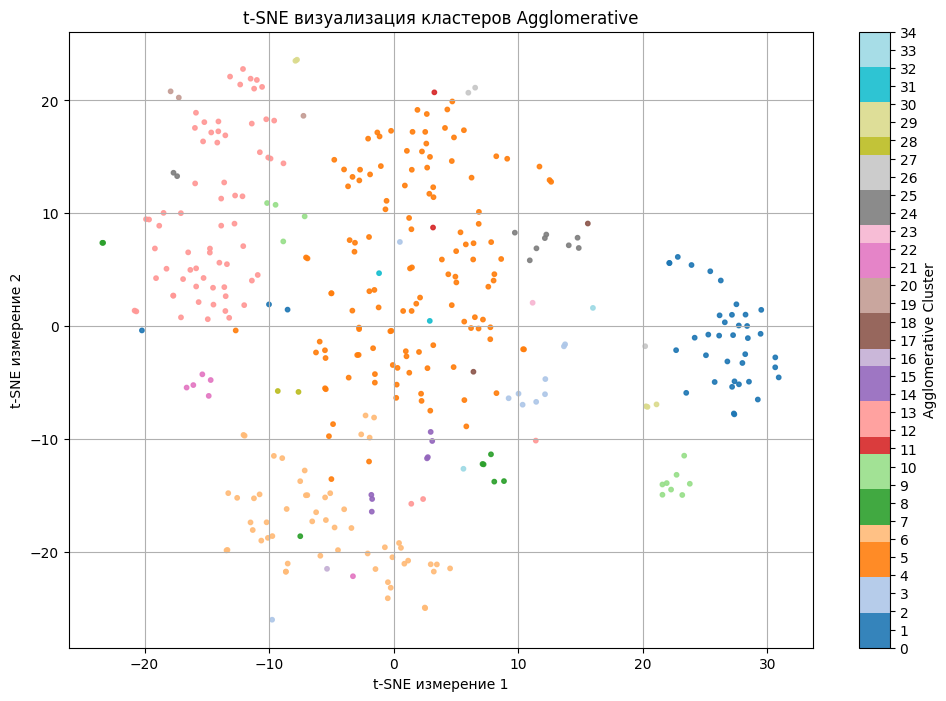

Agglomerative кластеры: {0: 37, 1: 3, 2: 2, 3: 8, 4: 6, 5: 118, 6: 55, 7: 6, 8: 2, 9: 4, 10: 8, 11: 2, 12: 3, 13: 65, 14: 4, 15: 3, 16: 1, 17: 1, 18: 1, 19: 1, 20: 2, 21: 1, 22: 5, 23: 1, 24: 8, 25: 2, 26: 2, 27: 1, 28: 2, 29: 3, 30: 2, 31: 1, 32: 1, 33: 1, 34: 1}
Файлы в кластере 11 (Agglomerative):
VoenObozren2016_2019_1_0044.t
VoenObozren2016_2019_1_0150.t


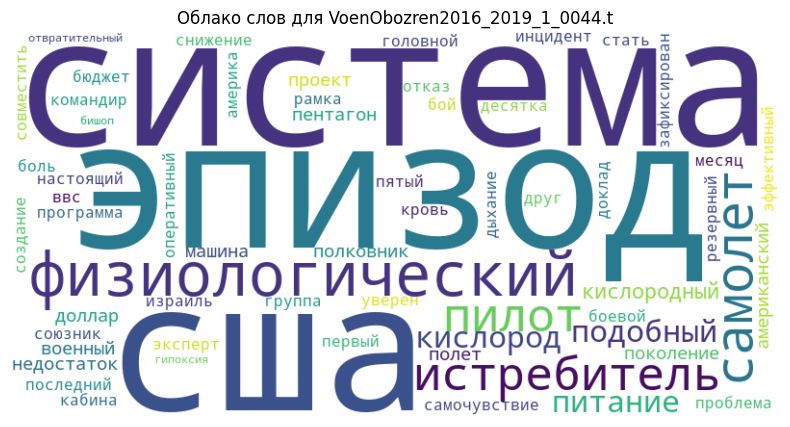

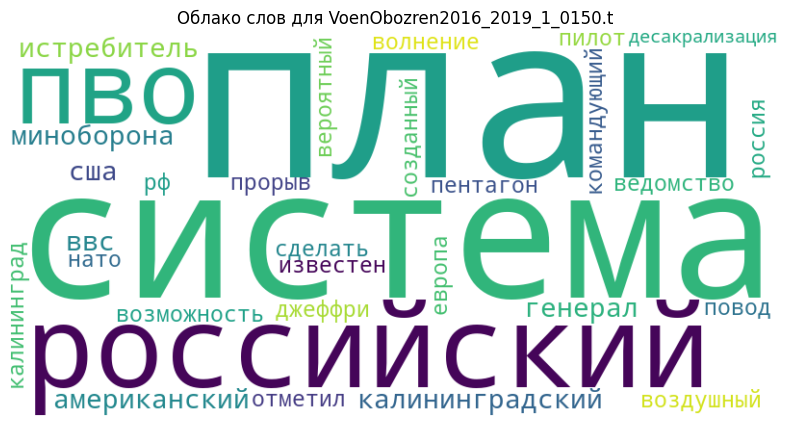

,Document,Cluster
0,VoenObozren2016_2019_1_0001.t,29
1,VoenObozren2016_2019_1_0002.t,14
2,VoenObozren2016_2019_1_0003.t,6
3,VoenObozren2016_2019_1_0004.t,0
4,VoenObozren2016_2019_1_0005.t,5
...,...,...
358,VoenObozren2016_2019_1_0363.t,6
359,VoenObozren2016_2019_1_0364.t,5
360,VoenObozren2016_2019_1_0365.t,10
361,VoenObozren2016_2019_1_0366.t,10


In [26]:
visualize_clusters(agglo_clusters['Cluster'].values, tfidf_matrix, "Agglomerative")
generate_word_cloud(11, agglo_clusters, "Agglomerative")
agglo_clusters

In [27]:
agglo_cluster_centers

,Cluster,Central_File
0,0,VoenObozren2016_2019_1_0222.t
1,1,VoenObozren2016_2019_1_0133.t
2,2,VoenObozren2016_2019_1_0010.t
3,3,VoenObozren2016_2019_1_0033.t
4,4,VoenObozren2016_2019_1_0289.t
5,5,VoenObozren2016_2019_1_0067.t
6,6,VoenObozren2016_2019_1_0073.t
7,7,VoenObozren2016_2019_1_0020.t
8,8,VoenObozren2016_2019_1_0007.t
9,9,VoenObozren2016_2019_1_0008.t


In [28]:
evaluate_clustering_quality(tfidf_matrix, agglo_labels, "Agglomerative")

Метрики качества для Agglomerative:
  - Силуэтный коэффициент: 0.06252960405780357
  - Коэффициент Давиеса-Боулдина: 2.1815996452010133


In [29]:
output_path = "..\\..\\data\\words\\dataprocessed_dataset.csv"
df.to_csv(output_path, index=False, encoding='windows-1251')
print(f"Данные успешно сохранены в {output_path}")

Данные успешно сохранены в ..\..\data\words\dataprocessed_dataset.csv


In [30]:
def visualize_similar_documents_full(query_index, tfidf_matrix, similar_indices, method_name):
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000, metric='cosine')
    
    if not isinstance(tfidf_matrix, np.ndarray):
        matrix = tfidf_matrix.toarray()
    else:
        matrix = tfidf_matrix
        
    tsne_res = tsne.fit_transform(matrix)

    plt.figure(figsize=(14, 10))

    labels = np.full(matrix.shape[0], 'Остальные', dtype=object)
    labels[similar_indices] = 'Похожие'
    labels[query_index] = 'Запрос'

    color_map = {'Остальные': 'lightgray', 'Похожие': 'blue', 'Запрос': 'red'}
    colors = [color_map[label] for label in labels]

    plt.scatter(tsne_res[:, 0], tsne_res[:, 1], c=colors, s=30, alpha=0.8)

    indices_to_annotate = [query_index] + list(similar_indices)
    texts = []
    for i in indices_to_annotate:
        text = plt.text(tsne_res[i, 0], tsne_res[i, 1], doc_word_matrix.index[i], 
                        fontsize=9, weight='bold', color='black')
        texts.append(text)

    adjust_text(texts, 
                only_move={'points': 'y', 'texts': 'y'}, 
                arrowprops=dict(arrowstyle='-', color='gray', lw=0.5),
                force_text=0.8, force_points=0.5)

    plt.title(f't-SNE визуализация всех документов ({method_name})')
    plt.xlabel('t-SNE измерение 1')
    plt.ylabel('t-SNE измерение 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()



def show_wordcloud_for_documents(indices, method_name):
    for idx in indices:
        doc_name = doc_word_matrix.index[idx]
        doc_data = filtered_df[filtered_df['DocumentName'] == doc_name]
        word_freq = dict(zip(doc_data['NormalizedWord'], doc_data['FrequencyInText']))
        wc = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
        plt.figure(figsize=(10, 5))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Облако слов для {doc_name} ({method_name})')
        plt.show()


def print_similar_documents_with_text(query_doc_name, method_name, similar_doc_names, scores):
    print(f"\n===== Метод: {method_name} =====")
    print(f"\n🔍 Документ запроса: {query_doc_name}")
    
    query_text = df[df['DocumentName'] == query_doc_name]['NormalizedWord'].tolist()

    for doc_name, score in zip(similar_doc_names, scores):
        doc_text = df[df['DocumentName'] == doc_name]['NormalizedWord'].tolist()
        print(f"📄 Документ: {doc_name}")
        print(f"Метрика близости: {score:.4f}")

In [31]:
query_doc_name = 'VoenObozren2016_2019_1_0095.t'
query_index = doc_word_matrix.index.get_loc(query_doc_name)

similarities = similarity_matrix[query_index]

top_n = 10
top_indices = np.argsort(similarities)[::-1][1:top_n + 1]
top_sim_scores_cosine = similarities[top_indices]
top_sim_docs_cosine = doc_word_matrix.index[top_indices]


===== Метод: Cosine Similarity =====

🔍 Документ запроса: VoenObozren2016_2019_1_0095.t
📄 Документ: VoenObozren2016_2019_1_0099.t
Метрика близости: 0.6653
📄 Документ: VoenObozren2016_2019_1_0098.t
Метрика близости: 0.6636
📄 Документ: VoenObozren2016_2019_1_0106.t
Метрика близости: 0.6372
📄 Документ: VoenObozren2016_2019_1_0101.t
Метрика близости: 0.6367
📄 Документ: VoenObozren2016_2019_1_0097.t
Метрика близости: 0.5413
📄 Документ: VoenObozren2016_2019_1_0323.t
Метрика близости: 0.4854
📄 Документ: VoenObozren2016_2019_1_0213.t
Метрика близости: 0.3640
📄 Документ: VoenObozren2016_2019_1_0082.t
Метрика близости: 0.3315
📄 Документ: VoenObozren2016_2019_1_0024.t
Метрика близости: 0.3188
📄 Документ: VoenObozren2016_2019_1_0062.t
Метрика близости: 0.2866


C:\Users\Juliana\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


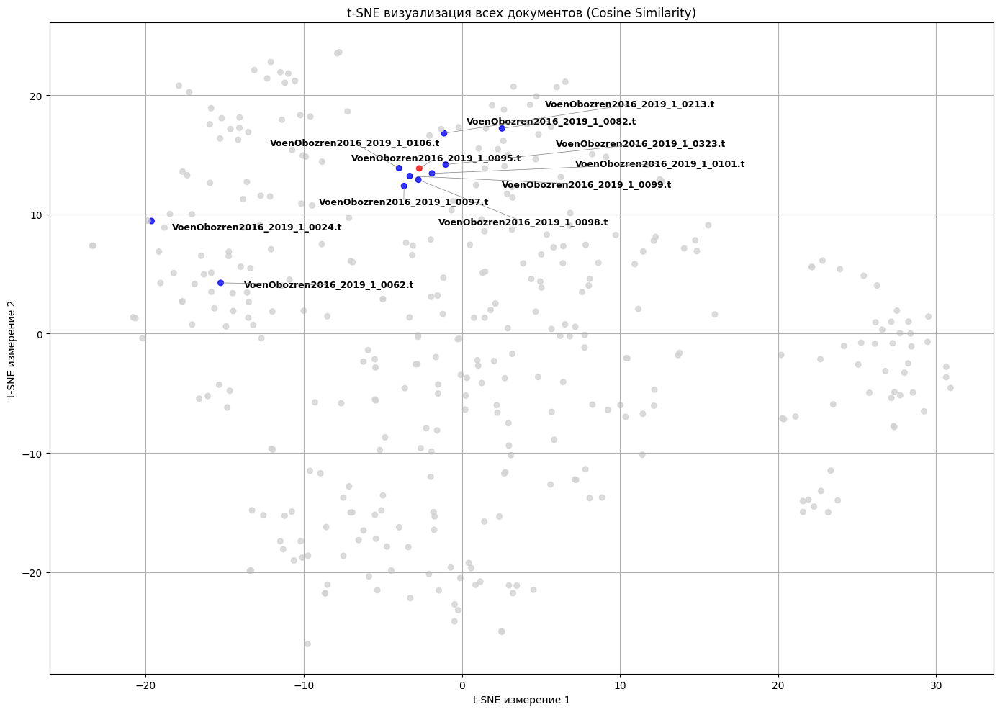

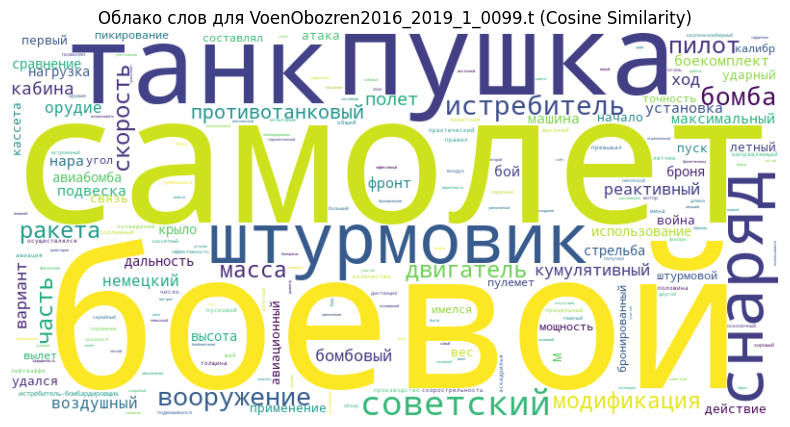

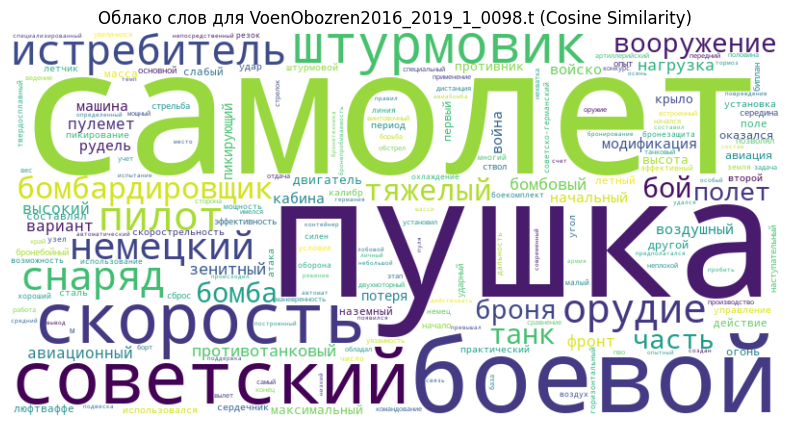

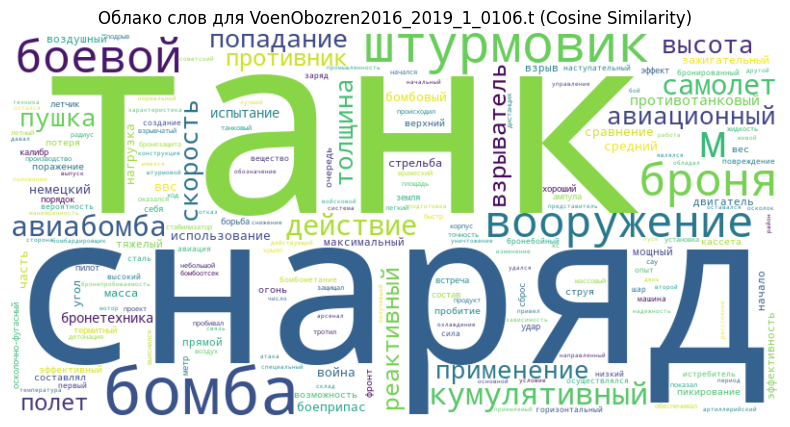

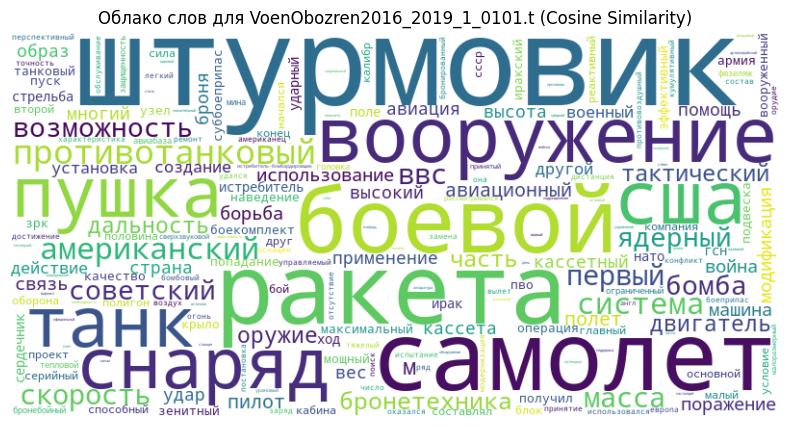

...

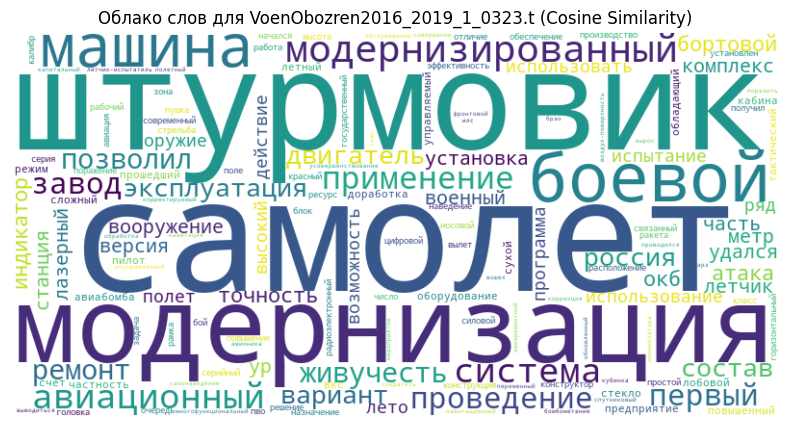

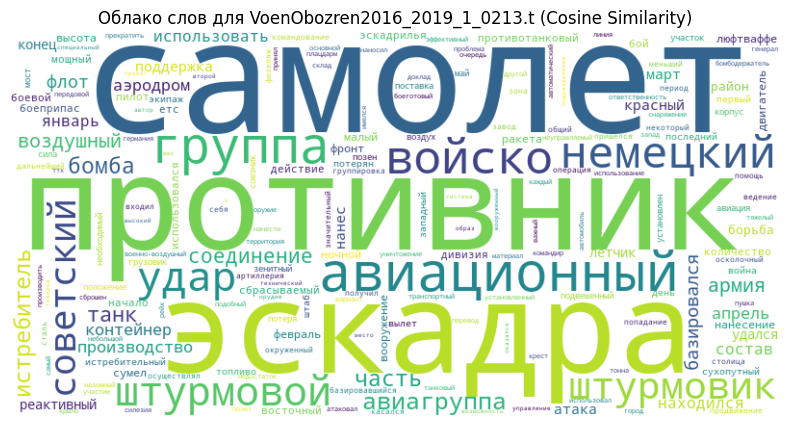

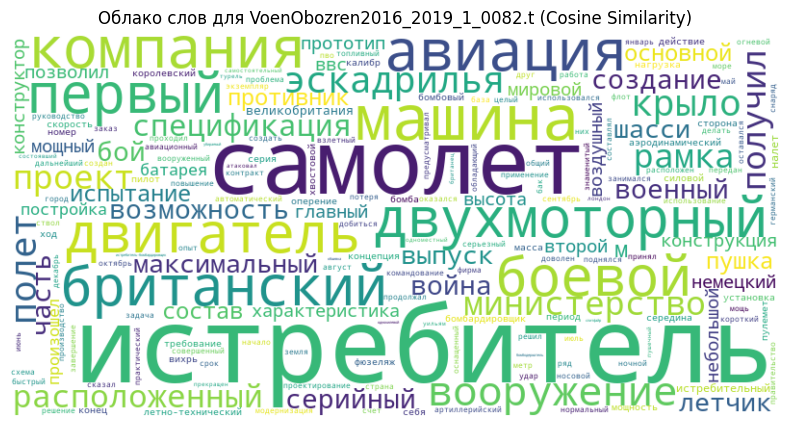

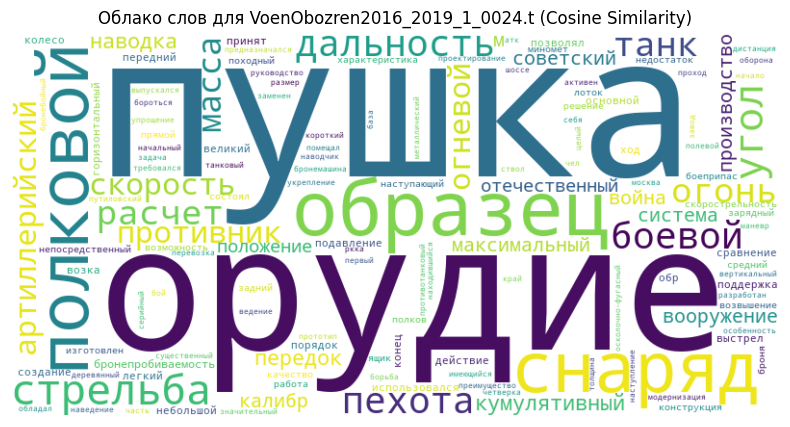

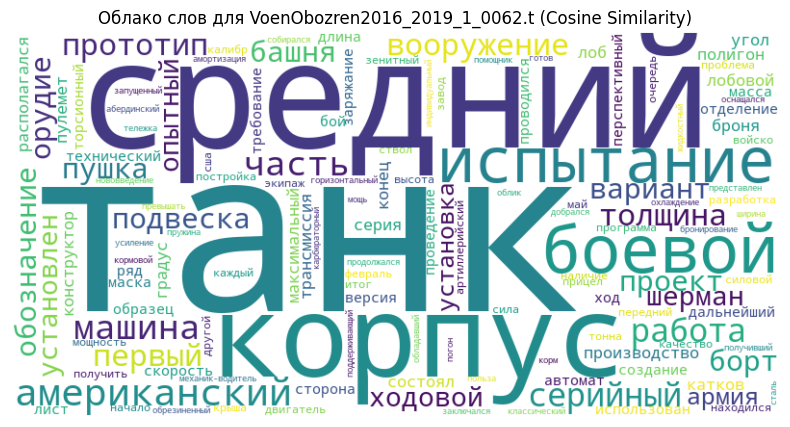

In [32]:
print_similar_documents_with_text(query_doc_name, "Cosine Similarity", top_sim_docs_cosine, top_sim_scores_cosine)
visualize_similar_documents_full(query_index, tfidf_matrix, top_indices, "Cosine Similarity")
show_wordcloud_for_documents(top_indices, "Cosine Similarity")